## 1. Data Preparation

### Dataset Introduction
The Data folder contains 2 data files:

1. paper_information.csv    -- the complete list of 5,746 papers including title, publisher, doi, abstract, keywords, references, paper_id  for each  from four journals (the detailed list is shown below). 

2. paper_edge_citation.csv    --the edges in the citation network for the node 'paper_id'. There are 23,737 edges, and each edge represents that 'source' cites 'target' once. Edges between papers are directed. 

Journals are listed as follows:

 [1] JOURNAL OF THE AMERICAN STATISTICAL ASSOCIATION                             
 [2] BIOMETRIKA                                                   
 [3] JOURNAL OF THE ROYAL STATISTICAL SOCIETY SERIES B-STATISTICAL METHODOLOGY  
 [4] ANNALS OF STATISTICS

 We use abbreviation for each journal in the following analysis:  
    [1] JASA                             
    [2] Biometrika                                                  
    [3] J. R. Stat. Soc. B  
    [4] Ann. Stat

using to find the publishments status and citation network of authors in these four journals. 

In [56]:
import pandas as pd
import sys
import os
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import networkx as nx
import plotly.graph_objects as go

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [57]:
crawled_details = pd.read_csv('crawled_details.csv')
print(crawled_details.head())

                  doi     first_author  \
0  10.1214/14-AOS1212  Luciano Pomatto   
1  10.1214/14-AOS1213       Jean Jacod   
2  10.1214/14-AOS1214        Wenge Guo   
3  10.1214/14-AOS1215     Debdeep Pati   
4  10.1214/13-AOS1179       Jean Jacod   

                           middle_authors      last_author  \
0                      Nabil I. Al‐Najjar  Alvaro Sandroni   
1                                     NaN   Viktor Todorov   
2                                   Li He  Sanat K. Sarkar   
3  Anirban Bhattacharya; Natesh S. Pillai     David Dunson   
4                                     NaN      Markus Reiß   

  corresponding_author    year author_status year_status  
0                  NaN  2014.0       success     success  
1                  NaN  2014.0       success     success  
2            Wenge Guo  2014.0       success     success  
3         Debdeep Pati  2014.0       success     success  
4                  NaN  2014.0       success     success  


In [58]:
# Core helper functions

def clean_title(s: str) -> str:
    if pd.isna(s):
        return ''
    return ' '.join(str(s).strip().split())

def clean_doi(s: str) -> str:
    if pd.isna(s) or s in ['NO DOI', '']:
        return ''
    return str(s).strip().lower()

def load_datasets(config: dict) -> tuple[pd.DataFrame, pd.DataFrame]:
    print("Loading datasets...")
    raw_info = pd.read_csv(config['files']['info'])
    citations = pd.read_csv(config['files']['edges'])
    return raw_info, citations

def filter_big4_journals(raw_info: pd.DataFrame, config: dict) -> pd.DataFrame:
    target_journals = config['journal_mapping'].keys()
    mask = raw_info['publisher'].isin(target_journals)
    clean_info = raw_info[mask].copy()
    clean_info['publisher'] = clean_info['publisher'].replace(config['journal_mapping'])
    return clean_info

def standardize_fields(paper_info: pd.DataFrame) -> pd.DataFrame:
    df = paper_info.copy()
    if 'title' in df.columns:
        df['title'] = df['title'].apply(clean_title)
    if 'doi' in df.columns:
        df['doi'] = df['doi'].apply(clean_doi)
    return df

In [59]:
def summarize_missing(paper_info: pd.DataFrame) -> None:
    """Print missing data summary."""
    cond_doi = (paper_info['doi'].isna()) | (paper_info['doi'] == '') | (paper_info['doi'] == 'NO DOI')
    cond_abs = (paper_info['abstract'].isna()) | (paper_info['abstract'] == '') | (paper_info['abstract'] == 'no abstract')
    cond_refs = (paper_info['references'].isna()) | (paper_info['references'] == '') | (paper_info['references'] == '[]')

    print(f"Missing DOI: {cond_doi.sum()}")
    print(f"Missing Abstract: {cond_abs.sum()}")
    print(f"Missing References: {cond_refs.sum()}")
    print(f"Rows with any missing: {(cond_doi | cond_abs | cond_refs).sum()}")
    print(f"Unique non-empty DOIs: {paper_info.loc[~cond_doi, 'doi'].nunique()}")

In [60]:
def print_dataset_report(n_original, n_clean, n_removed, n_citations, journal_counts):
    """Print dataset report."""
    print(f"Original Papers: {n_original}")
    print(f"Removed (Non-Big4): {n_removed}")
    print(f"Final Papers: {n_clean}")
    print(f"Total Citations: {n_citations}")
    print(f"Avg Citations/Paper: {n_citations/n_clean:.2f}")
    print("Journal Distribution:")
    print(journal_counts.to_string())

In [61]:
DATA_CONFIG = {
    "files": {
        "info": "paper_edge_citation.csv",
        "edges": "edges.csv",
    },

    # ✅ 让 filter_big4_journals 能找到它要的键
    "journal_mapping": {
        "JOURNAL OF THE AMERICAN STATISTICAL ASSOCIATION": "JASA",
        "BIOMETRIKA": "Biometrika",
        "JOURNAL OF THE ROYAL STATISTICAL SOCIETY SERIES B-STATISTICAL METHODOLOGY": "JRSS-B",
        "ANNALS OF STATISTICS": "Annals",
    }
}
# --- 3. Execution (执行层) ---

# 1. 读取原始数据
raw_info, paper_citations = load_datasets(DATA_CONFIG)

# 2. 过滤统计四大 + 映射简称
paper_info = filter_big4_journals(raw_info, DATA_CONFIG)

# 3. 标准化 title / doi 等字段
paper_info = standardize_fields(paper_info)

# 4. 打印数据集总体报告
print_dataset_report(
    n_original=len(raw_info),
    n_clean=len(paper_info),
    n_removed=len(raw_info) - len(paper_info),
    n_citations=len(paper_citations),
    journal_counts=paper_info['publisher'].value_counts().sort_index()
)

# 5. 打印缺失数据报告（这里你就能清楚地看到“缺 DOI 的行数”到底是多少）
summarize_missing(paper_info)


Loading datasets...
Original Papers: 5746
Removed (Non-Big4): 8
Final Papers: 5738
Total Citations: 23737
Avg Citations/Paper: 4.14
Journal Distribution:
publisher
Annals        1733
Biometrika    1238
JASA          2017
JRSS-B         750
Missing DOI: 216
Missing Abstract: 295
Missing References: 3
Rows with any missing: 465
Unique non-empty DOIs: 5521


In [62]:
paper_info = paper_info.merge(
    crawled_details[['doi', 'year', 'first_author', 'middle_authors', 'last_author']],
    on='doi',
    how='left'
)

In [63]:
paper_info

,paper_id,title,publisher,doi,abstract,references,keywords,year,first_author,middle_authors,last_author
0,1,MERGING AND TESTING OPINIONS,Annals,10.1214/14-aos1212,We study the merging and the testing of opinio...,"no title+Al-Najjar, N.; Pomatto, L.; Sandroni,...","Test manipulation,Bayesian learning",NaN,NaN,NaN,NaN
1,2,EFFICIENT ESTIMATION OF INTEGRATED VOLATILITY ...,Annals,10.1214/14-aos1213,We propose new nonparametric estimators of the...,ESTIMATING THE DEGREE OF ACTIVITY OF JUMPS IN ...,"Quadratic variation,Ito semimartingale,integra...",NaN,NaN,NaN,NaN
2,3,FURTHER RESULTS ON CONTROLLING THE FALSE DISCO...,Annals,10.1214/14-aos1214,The probability of false discovery proportion ...,The control of the false discovery rate in mul...,"gamma-FDP,generalized gamma-FDP,multiple testi...",NaN,NaN,NaN,NaN
3,4,POSTERIOR CONTRACTION IN SPARSE BAYESIAN FACTO...,Annals,10.1214/14-aos1215,Sparse Bayesian factor models are routinely im...,On some inequalities for the incomplete gamma ...,"Bayesian estimation,covariance matrix,factor m...",NaN,NaN,NaN,NaN
4,5,A REMARK ON THE RATES OF CONVERGENCE FOR INTEG...,Annals,10.1214/13-aos1179,The optimal rate of convergence of estimators ...,Power and bipower variation withstochastic vol...,"Semimartingale,volatility,jumps,infinite activ...",NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
5733,6502,Parametric and semiparametric models for recap...,JRSS-B,10.1111/1467-9868.00302,Capture-recapture processes are biased samplin...,COX REGRESSION-MODEL FOR COUNTING-PROCESSES - ...,"efficiency,identifiability,linear integral ope...",2001.0,Kani Chen,NaN,NaN
5734,6503,A general method of constructing E(s(2))-optim...,JRSS-B,10.1111/1467-9868.00303,There has been much recent interest in supersa...,"SOME SYSTEMATIC SUPERSATURATED DESIGNS+BOOTH, ...","balanced incomplete-block designs,cyclic gener...",2001.0,Neil A. Butler,Roger Mead; Kent M. Eskridge,Steven G. Gilmour
5735,6506,Dynamic models for spatiotemporal data,JRSS-B,10.1111/1467-9868.00305,We propose a model for non-stationary spatiote...,no title+BOX GEP+TIME SERIES ANAL FOR+1989::Oz...,"Bayesian inference,locally weighted mixture,on...",2001.0,Jonathan Stroud,NaN,Bruno Sansó
5736,6507,On expected volumes of multidimensional confid...,JRSS-B,10.1111/1467-9868.00306,"We consider a general multiparameter set-up, w...",ADJUSTED VERSIONS OF PROFILE LIKELIHOOD AND DI...,"Bartlett correction,highest posterior density ...",2001.0,Gauri Sankar Datta,NaN,Thomas J. DiCiccio


In [64]:
# 处理空字符串
cols_author = ['first_author', 'middle_authors', 'last_author']
paper_info[cols_author + ['doi', 'year']] = (
    paper_info[cols_author + ['doi', 'year']]
    .replace('', pd.NA)
)

n = len(paper_info)

missing_authors = paper_info[cols_author].isna().all(axis=1).sum()
missing_doi = paper_info['doi'].isna().sum()
missing_year = paper_info['year'].isna().sum()

print("=== Missing Field Summary ===")
print(f"Authors (all three missing): {missing_authors} ({missing_authors/n:.2%})")
print(f"DOI:                        {missing_doi} ({missing_doi/n:.2%})")
print(f"Year:                       {missing_year} ({missing_year/n:.2%})")

=== Missing Field Summary ===
Authors (all three missing): 1645 (28.67%)
DOI:                        216 (3.76%)
Year:                       1624 (28.30%)


In [65]:
paper_citations

,source,target
0,6318,4952
1,3817,4179
2,3817,3783
3,3817,3249
4,3817,6295
...,...,...
23732,6452,3203
23733,6452,3200
23734,6452,3157
23735,6458,6451


## 2. EDA 和 单变量分析

### Explanation of `print_quality_assessment` Function

This function performs a comprehensive data quality assessment for the citation network dataset. It evaluates three key aspects:

1. **Coverage (Isolated Nodes Analysis)**:
   - Identifies papers that are not involved in any citations (neither citing nor cited).
   - Calculates the isolation rate as the percentage of such papers.
   - A high isolation rate (>10%) may indicate incomplete data or a fragmented network.

2. **Accuracy (Citation Link Validity)**:
   - Checks if all citation sources and targets exist in the paper dataset.
   - Reports the number of invalid citations (pointing to non-existent papers).
   - Invalid targets are common when citations reference external papers not in the Big4 journals.

This assessment helps ensure the dataset is reliable for network analysis and identifies potential issues early.

In [69]:
def print_quality_assessment(paper_info: pd.DataFrame, paper_citations: pd.DataFrame):
    """
    Prints a data quality assessment report including coverage and accuracy checks.
    """
    print("=== Data Quality Assessment Report ===\n")

    # 1. Isolated Nodes (Coverage)
    all_nodes = set(paper_info['paper_id'])
    source_nodes = set(paper_citations['source'])
    target_nodes = set(paper_citations['target'])
    connected_nodes = source_nodes.union(target_nodes)
    isolated_nodes = all_nodes - connected_nodes
    isolation_rate = len(isolated_nodes) / len(all_nodes) if len(all_nodes) > 0 else 0

    print(f"1. [Coverage] Isolated Node Analysis:")
    print(f"   Total Papers: {len(all_nodes)}")
    print(f"   Isolated Papers: {len(isolated_nodes)} ({isolation_rate:.2%})")
    if isolation_rate > 0.1:
        print("   WARNING: High isolation rate (>10%). Citation network might be incomplete.")
    print("-" * 30)

    # 2. Accuracy (Citation Validity)
    # Check if edges connect to papers that don't exist in our paper_info
    invalid_sources = paper_citations[~paper_citations['source'].isin(all_nodes)]
    invalid_targets = paper_citations[~paper_citations['target'].isin(all_nodes)]

    print(f"2. [Accuracy] Citation Link Validity:")
    print(f"   Total Citations: {len(paper_citations)}")
    print(f"   Edges with unknown Source: {len(invalid_sources)}")
    print(f"   Edges with unknown Target: {len(invalid_targets)}")
    if len(invalid_targets) > 0:
        print("   Note: Unknown targets are common if the dataset only contains papers from specific journals, \n   but citations point to outside papers. If 'paper_edge_citation' is strictly internal, this is an error.")
    print("-" * 30)

print_quality_assessment(paper_info, paper_citations)

=== Data Quality Assessment Report ===

1. [Coverage] Isolated Node Analysis:
   Total Papers: 5738
   Isolated Papers: 0 (0.00%)
------------------------------
2. [Accuracy] Citation Link Validity:
   Total Citations: 23737
   Edges with unknown Source: 21
   Edges with unknown Target: 7
   Note: Unknown targets are common if the dataset only contains papers from specific journals, 
   but citations point to outside papers. If 'paper_edge_citation' is strictly internal, this is an error.
------------------------------


In [70]:
# Top cited papers
# “被引用数”是通过计算 paper_citations DataFrame 中 'target' 列的每个值的出现次数得来的。
top_cited = paper_citations['target'].value_counts().head(10)
print("Top 10 most cited papers:")
for paper_id, count in top_cited.items():
    title = paper_info.loc[paper_info['paper_id'] == paper_id, 'title'].values
    if len(title) > 0:
        print(f"{count} citations: {title[0]}")
    else:
        print(f"{count} citations: Paper ID {paper_id} (title not found)")

Top 10 most cited papers:
336 citations: Variable selection via nonconcave penalized likelihood and its oracle properties
209 citations: The adaptive lasso and its oracle properties
177 citations: Least angle regression
173 citations: High-dimensional graphs and variable selection with the Lasso
144 citations: The Dantzig selector: Statistical estimation when p is much larger than n
137 citations: Sure independence screening for ultrahigh dimensional feature space
129 citations: SIMULTANEOUS ANALYSIS OF LASSO AND DANTZIG SELECTOR
110 citations: NEARLY UNBIASED VARIABLE SELECTION UNDER MINIMAX CONCAVE PENALTY
108 citations: Model selection and estimation in regression with grouped variables
108 citations: Regularization and variable selection via the elastic net


In [71]:
# Top 10 most mentioned keywords
from collections import Counter

keywords_list = []
for kw in paper_info['keywords'].dropna():
    if isinstance(kw, str):
        # Split by comma first
        parts = [k.strip() for k in kw.split(',') if k.strip()]
        for part in parts:
            words = [w.strip().lower() for w in part.split() if w.strip()]
            if len(words) % 2 == 0:
                # Pair words into 2-word phrases
                for i in range(0, len(words), 2):
                    phrase = f"{words[i]} {words[i+1]}"
                    keywords_list.append(phrase)
            else:
                # Keep the whole phrase for odd lengths
                phrase = ' '.join(words)
                keywords_list.append(phrase)

keyword_counts = Counter(keywords_list)
top_keywords = keyword_counts.most_common(10)

print("Top 10 most mentioned keywords:")
for keyword, count in top_keywords:
    print(f"{count} mentions: {keyword}")

Top 10 most mentioned keywords:
203 mentions: monte carlo
189 mentions: markov chain
164 mentions: model selection
162 mentions: nonparametric regression
150 mentions: variable selection
144 mentions: sparsity
136 mentions: bootstrap
124 mentions: lasso
116 mentions: consistency
107 mentions: causal inference


In [72]:
# Journal comparison: average citations, keyword distribution

# Add citations column (in-degree) if not already added
if 'citations' not in paper_info.columns:
    in_degree = paper_citations['target'].value_counts()
    paper_info['citations'] = paper_info['paper_id'].map(in_degree).fillna(0)

# Average citations per journal (paper count already shown earlier)
journal_stats = paper_info.groupby('publisher')['citations'].mean().round(2)

print("Average Citations per Journal:")
print(journal_stats)
print()

# Keyword distribution per journal
print("Top keywords per journal:")
for journal in paper_info['publisher'].unique():
    journal_papers = paper_info[paper_info['publisher'] == journal]
    keywords_list = []
    for kw in journal_papers['keywords'].dropna():
        if isinstance(kw, str):
            keywords_list.extend([k.strip().lower() for k in kw.split(',') if k.strip()])
    if keywords_list:
        keyword_counts = Counter(keywords_list)
        top_kw = keyword_counts.most_common(5)
        print(f"{journal}: {top_kw}")
    else:
        print(f"{journal}: No keywords")
    print()

Average Citations per Journal:
publisher
Annals        5.26
Biometrika    2.98
JASA          3.56
JRSS-B        5.01
Name: citations, dtype: float64

Top keywords per journal:
Annals: [('sparsity', 79), ('nonparametric regression', 79), ('consistency', 66), ('model selection', 63), ('lasso', 47)]

Biometrika: [('markov chain monte carlo', 39), ('empirical likelihood', 34), ('estimating equation', 31), ('bootstrap', 31), ('model selection', 29)]

JASA: [('markov chain monte carlo', 101), ('variable selection', 54), ('causal inference', 49), ('nonparametric regression', 44), ('missing data', 43)]

JRSS-B: [('markov chain monte carlo methods', 34), ('bootstrap', 27), ('causal inference', 23), ('variable selection', 23), ('functional data analysis', 22)]



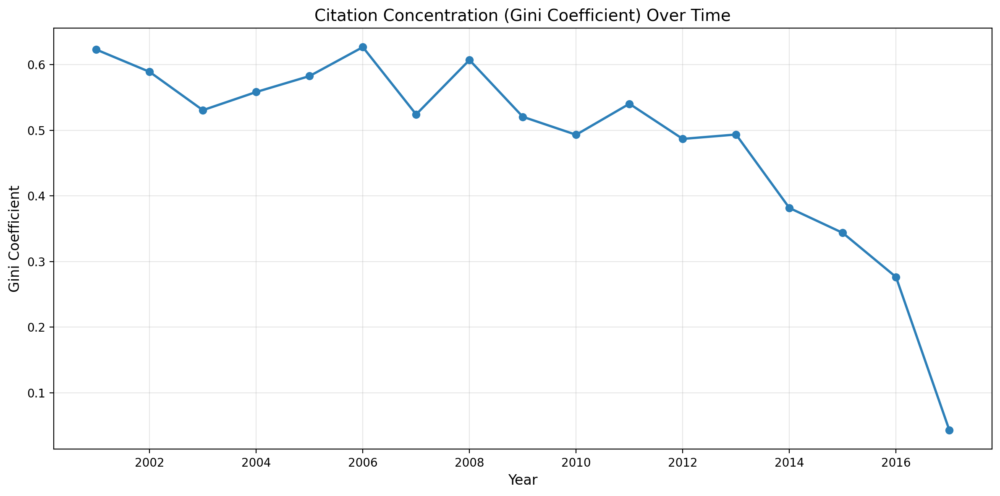

Gini Coefficient by Year:
  2001: 0.6230
  2002: 0.5891
  2003: 0.5307
  2004: 0.5584
  2005: 0.5826
  2006: 0.6268
  2007: 0.5242
  2008: 0.6071
  2009: 0.5206
  2010: 0.4932
  2011: 0.5404
  2012: 0.4869
  2013: 0.4936
  2014: 0.3817
  2015: 0.3438
  2016: 0.2765
  2017: 0.0433


In [101]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Function to calculate Gini coefficient
def gini_coefficient(x):
    """
    Calculate Gini coefficient (measure of inequality).
    Gini = 1 means perfect inequality, Gini = 0 means perfect equality.
    """
    x = np.array(x)
    x = x[~np.isnan(x)]  # Remove NaN values
    if len(x) == 0:
        return np.nan
    
    sorted_x = np.sort(x)
    n = len(sorted_x)
    cumsum = np.cumsum(sorted_x)
    
    # Gini coefficient formula
    gini = (2 * np.sum((np.arange(1, n+1)) * sorted_x)) / (n * np.sum(sorted_x)) - (n + 1) / n
    return gini

# Calculate Gini coefficient for each year
if 'year' in paper_info.columns and paper_info['year'].notna().any():
    gini_by_year = {}
    years = sorted(paper_info['year'].dropna().unique())
    
    for year in years:
        year_papers = paper_info[paper_info['year'] == year]['paper_id'].tolist()
        year_citations = paper_citations[paper_citations['target'].isin(year_papers)]
        citation_counts = year_citations['target'].value_counts().values
        
        if len(citation_counts) > 0:
            gini = gini_coefficient(citation_counts)
            gini_by_year[year] = gini
    
    # Plot
    if gini_by_year:
        years_plot = sorted(gini_by_year.keys())
        gini_values = [gini_by_year[y] for y in years_plot]
        
        plt.figure(figsize=(12, 6))
        plt.plot(years_plot, gini_values, marker='o', linewidth=2, markersize=6, color='#2C7FB8')
        plt.xlabel('Year', fontsize=12)
        plt.ylabel('Gini Coefficient', fontsize=12)
        plt.title('Citation Concentration (Gini Coefficient) Over Time', fontsize=14)
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()
        
        print("Gini Coefficient by Year:")
        for year in years_plot:
            print(f"  {int(year)}: {gini_by_year[year]:.4f}")
    else:
        print("No citation data available for years in the dataset.")
else:
    print("Year information not available in dataset.")

## 3. Data Visualization

### Journal Distribution Bar Chart
This bar chart shows the number of papers published in each of the Big4 statistics journals, providing an overview of the dataset's composition.

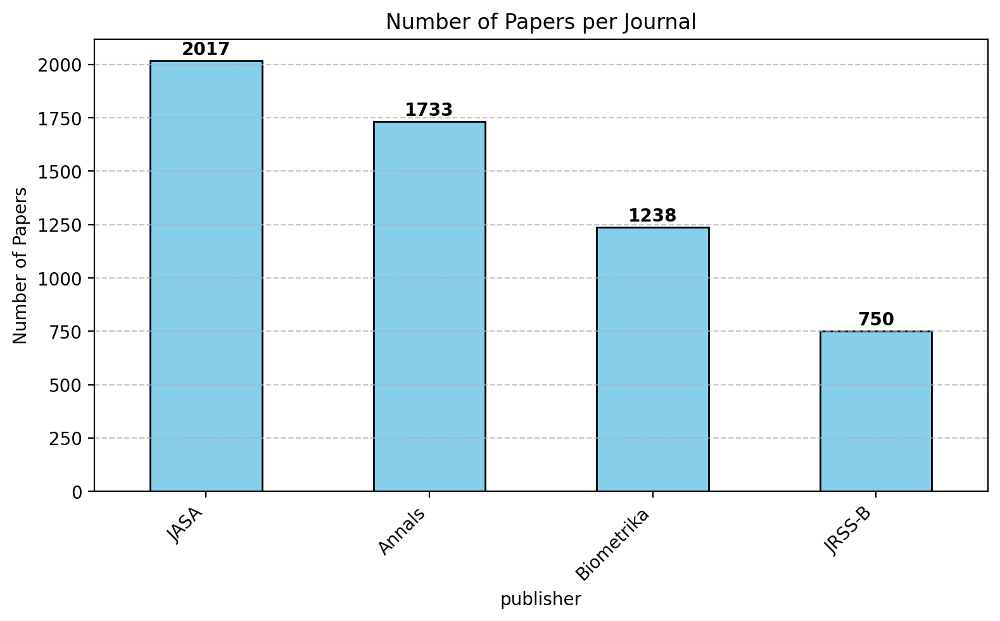

In [73]:
counts = paper_info['publisher'].value_counts().sort_values(ascending=False)
ax = counts.plot(kind='bar', figsize=(8,5), color='skyblue', edgecolor='black', title='Number of Papers per Journal')
plt.ylabel('Number of Papers')
plt.grid(True, axis='y', linestyle='--', alpha=0.7)
for i, v in enumerate(counts):
    ax.text(i, v + 10, str(v), ha='center', va='bottom', fontsize=10, fontweight='bold')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

### Citations Histogram
This histogram displays the distribution of citation counts (in-degree) for all papers, showing how citations are spread across the dataset.

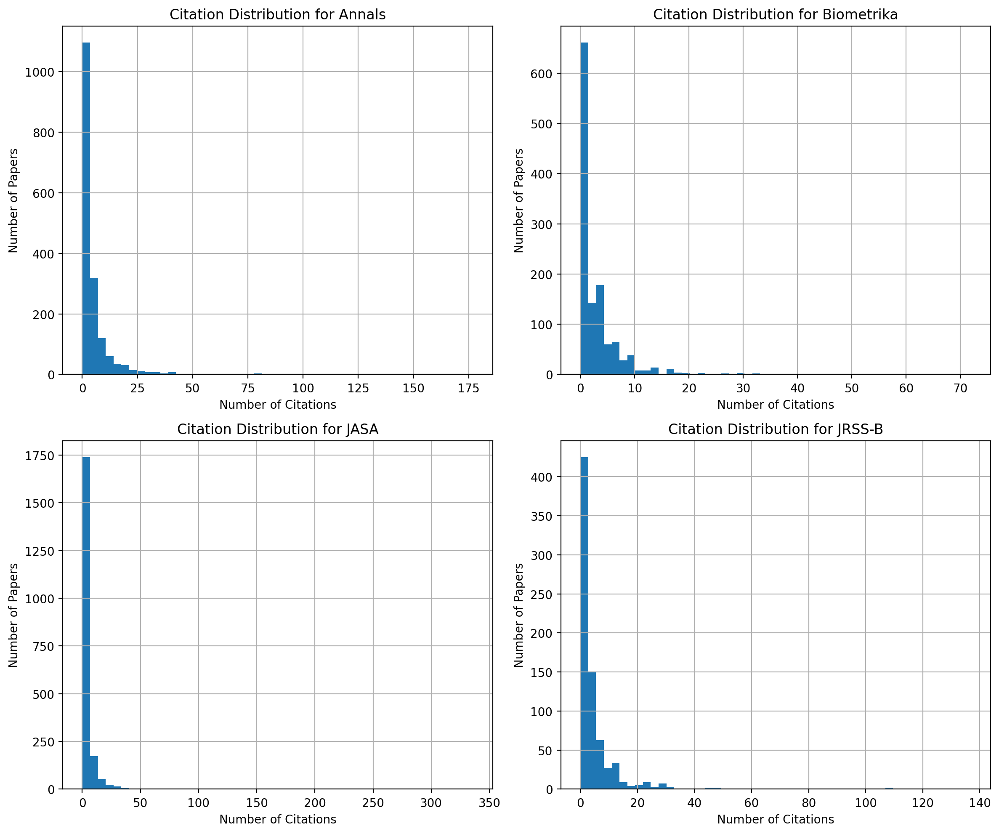

In [74]:
journals = paper_info['publisher'].unique()
fig, axes = plt.subplots(2, 2, figsize=(12,10))
axes = axes.flatten()
for i, journal in enumerate(journals):
    journal_data = paper_info[paper_info['publisher'] == journal]
    journal_data['citations'].hist(bins=50, ax=axes[i])
    axes[i].set_title(f'Citation Distribution for {journal}')
    axes[i].set_xlabel('Number of Citations')
    axes[i].set_ylabel('Number of Papers')
plt.tight_layout()
plt.show()

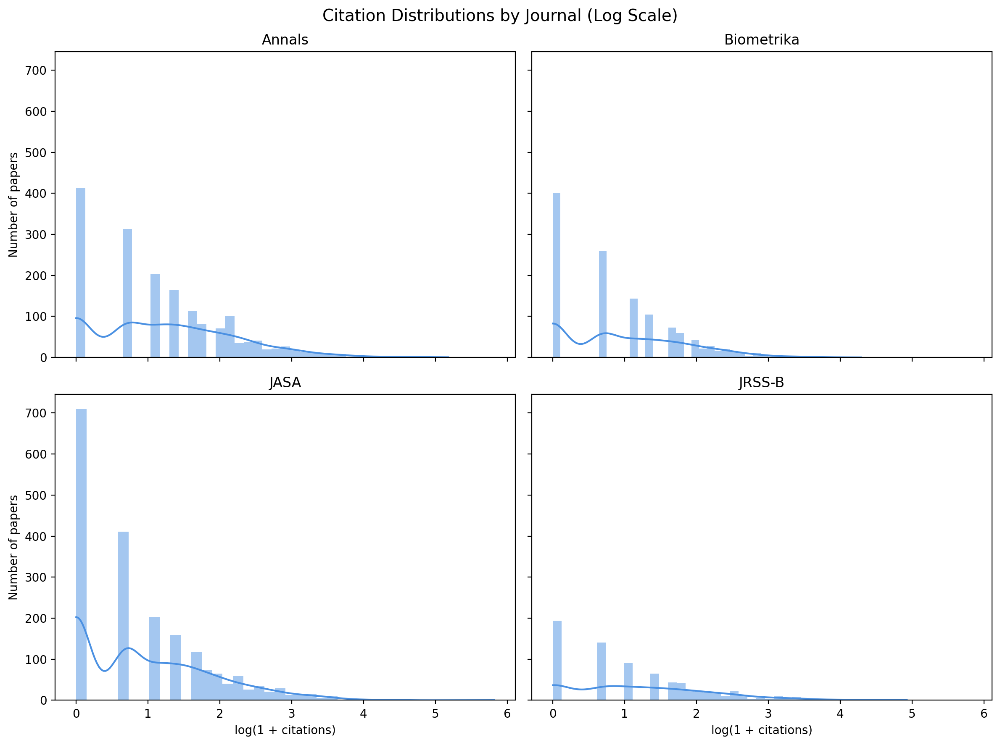

In [102]:
journals = sorted(paper_info['publisher'].unique())

fig, axes = plt.subplots(2, 2, figsize=(12, 9), sharex=True, sharey=True)
axes = axes.flatten()

for i, journal in enumerate(journals):
    data = paper_info.loc[
        paper_info['publisher'] == journal, 'citations'
    ]

    # log(1 + citations) to handle zeros
    data_log = np.log1p(data)

    sns.histplot(
        data_log,
        bins=40,
        kde=True,
        ax=axes[i],
        color='#4A90E2',
        edgecolor=None
    )

    axes[i].set_title(journal, fontsize=12)
    axes[i].set_xlabel('log(1 + citations)')
    axes[i].set_ylabel('Number of papers')

fig.suptitle(
    'Citation Distributions by Journal (Log Scale)',
    fontsize=14
)

plt.tight_layout()
plt.show()

### Average Citations per Journal Bar Chart
This bar chart compares the average number of citations received by papers from each journal, highlighting differences in impact.

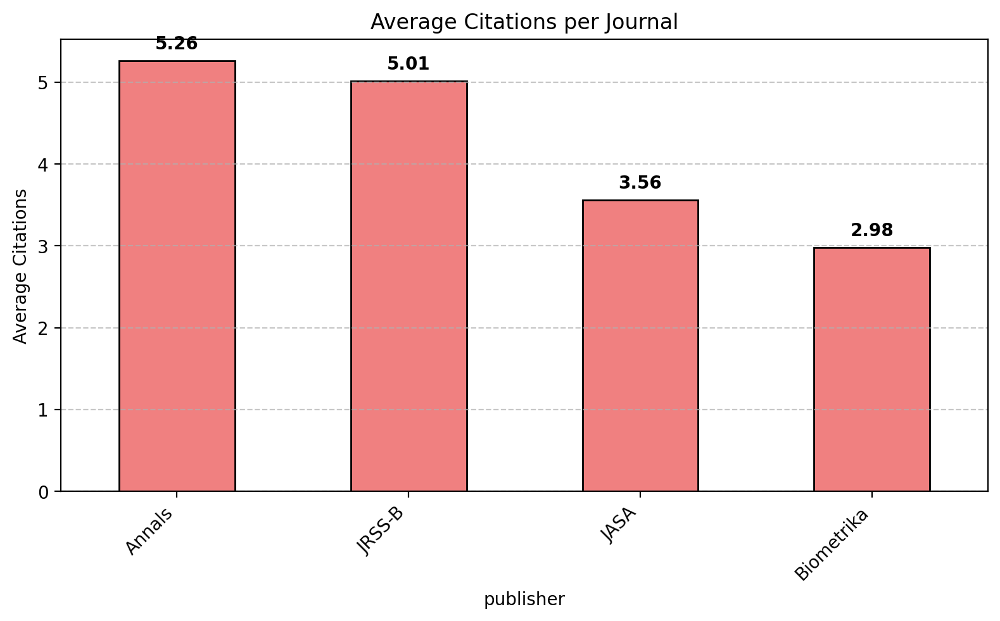

In [75]:
sorted_stats = journal_stats.sort_values(ascending=False)
ax = sorted_stats.plot(kind='bar', figsize=(8,5), color='lightcoral', edgecolor='black', title='Average Citations per Journal')
plt.ylabel('Average Citations')
plt.grid(True, axis='y', linestyle='--', alpha=0.7)
for i, v in enumerate(sorted_stats):
    ax.text(i, v + 0.1, f'{v:.2f}', ha='center', va='bottom', fontsize=10, fontweight='bold')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

### Keywords Word Cloud
This word cloud visualizes the most frequent keywords in the dataset, with larger words indicating higher frequency.

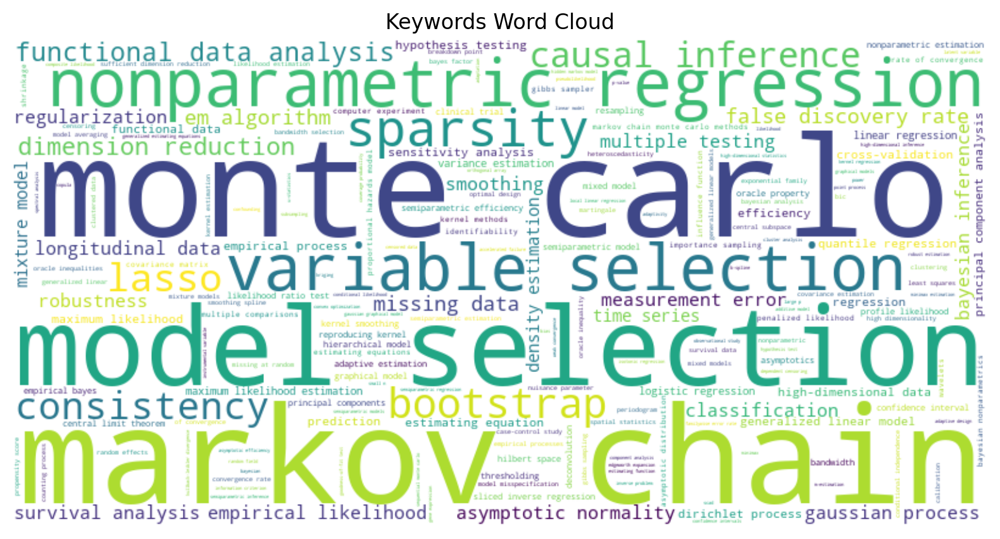

In [76]:
from collections import Counter

keywords_list = []
for kw in paper_info['keywords'].dropna():
    if isinstance(kw, str):
        # Split by comma first
        parts = [k.strip() for k in kw.split(',') if k.strip()]
        for part in parts:
            words = [w.strip().lower() for w in part.split() if w.strip()]
            if len(words) % 2 == 0:
                # Pair words into 2-word phrases
                for i in range(0, len(words), 2):
                    phrase = f"{words[i]} {words[i+1]}"
                    keywords_list.append(phrase)
            else:
                # Keep the whole phrase for odd lengths
                phrase = ' '.join(words)
                keywords_list.append(phrase)

keyword_counts = Counter(keywords_list)

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(keyword_counts)

plt.figure(figsize=(10,5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Keywords Word Cloud')
plt.show()

### Citation Network Subgraph
This graph visualizes a subgraph of the citation network, focusing on the top 10 most cited papers and the papers that cite them.

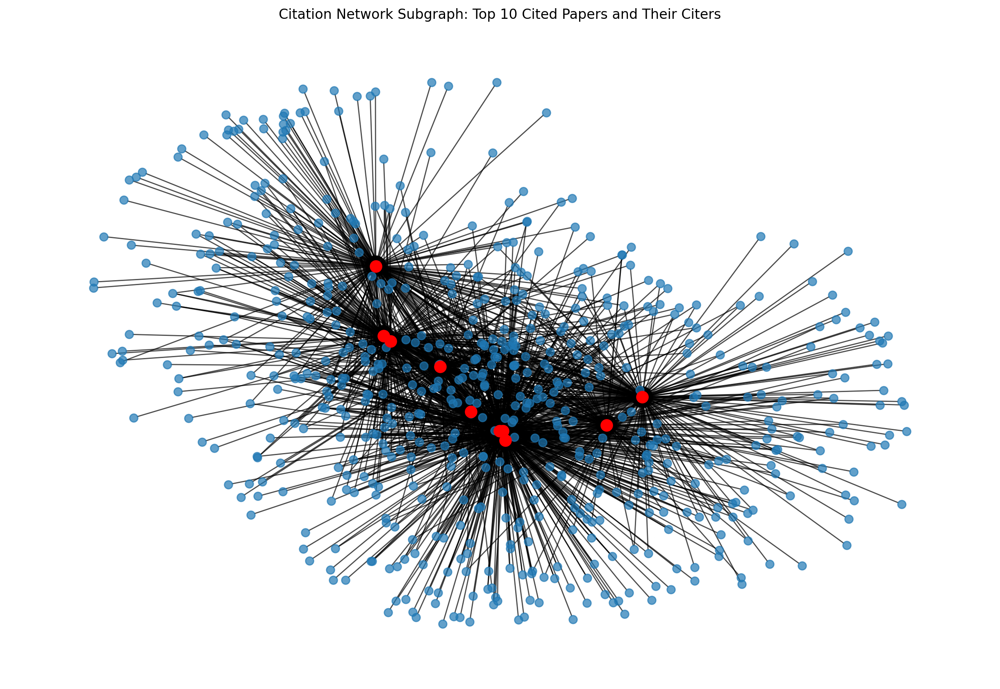

In [77]:
# Citation network subgraph
# Get top 10 cited paper IDs
top_cited = paper_citations['target'].value_counts().head(10)
top_10_ids = top_cited.index.tolist()

# Select edges where target is in top 10
sub_edges = paper_citations[paper_citations['target'].isin(top_10_ids)]

# Nodes: sources in sub_edges + top_10_ids
nodes = set(sub_edges['source']).union(set(top_10_ids))

# Create subgraph
G = nx.DiGraph()
G.add_nodes_from(nodes)
for _, row in sub_edges.iterrows():
    G.add_edge(row['source'], row['target'])

# Plot
plt.figure(figsize=(12, 8))
pos = nx.spring_layout(G, k=0.1)  # Force-directed layout
nx.draw(G, pos, with_labels=False, node_size=50, arrows=True, alpha=0.7)
# Highlight top cited papers
nx.draw_networkx_nodes(G, pos, nodelist=top_10_ids, node_color='red', node_size=100)
plt.title('Citation Network Subgraph: Top 10 Cited Papers and Their Citers')
plt.show()

In [78]:
paper_info['first_author'].nunique()

2412

=== Author Citation Graph Summary ===
Nodes (authors): 2,314
Edges (author->author): 8,682


<Figure size 1600x1200 with 0 Axes>

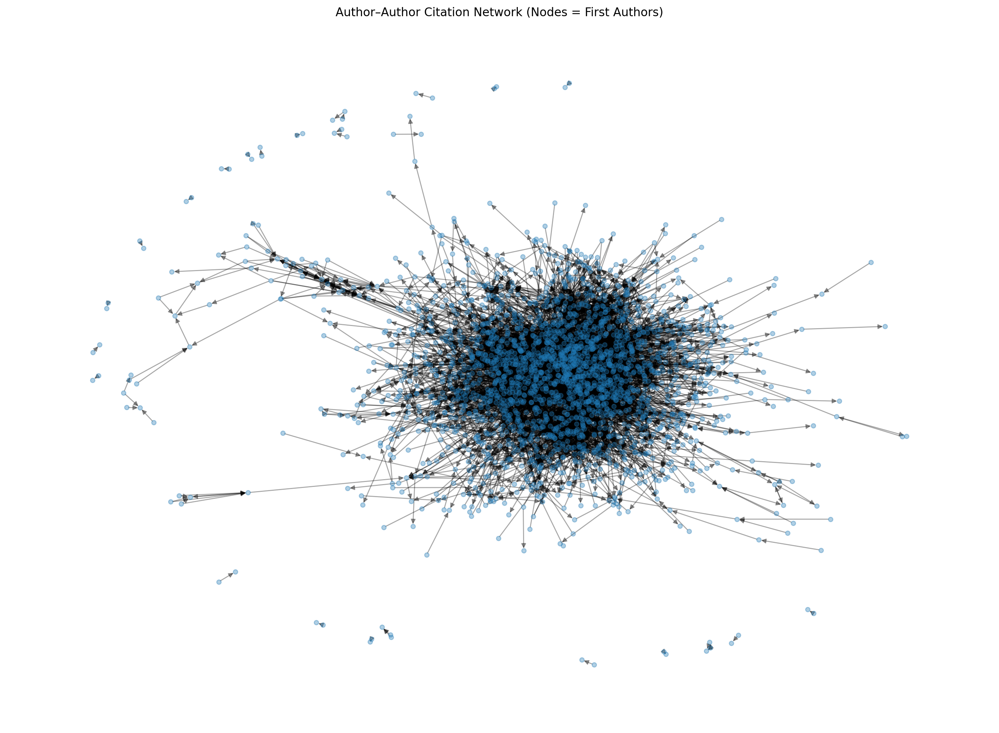

In [84]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

# =========================
# Author–Author Citation Graph
# Node = first_author
# Edge A -> B if ANY paper by author A cites ANY paper by author B
# =========================

# 0) Clean empty strings (optional but recommended)
paper_info['first_author'] = paper_info['first_author'].replace('', pd.NA)

# 1) Build mapping: paper_id -> first_author
id_to_author = paper_info.set_index('paper_id')['first_author'].to_dict()

# 2) Map paper citation edges (paper_id -> paper_id) into author edges (author -> author)
tmp = paper_citations[['source', 'target']].copy()
tmp['src_author'] = tmp['source'].map(id_to_author)
tmp['tgt_author'] = tmp['target'].map(id_to_author)

# 3) Keep valid author-author citations
aa = tmp.dropna(subset=['src_author', 'tgt_author'])

# (Optional) remove self-citations at author level
aa = aa[aa['src_author'] != aa['tgt_author']]

# 4) Collapse: "as long as cited once, keep one edge"
author_edges = aa[['src_author', 'tgt_author']].drop_duplicates()

# 5) Build graph
G = nx.DiGraph()
G.add_edges_from(author_edges.itertuples(index=False, name=None))

print("=== Author Citation Graph Summary ===")
print(f"Nodes (authors): {G.number_of_nodes():,}")
print(f"Edges (author->author): {G.number_of_edges():,}")

# 6) Plot (full graph can be huge; this still runs but may look like a hairball)
plt.figure(figsize=(14, 10))
pos = nx.spring_layout(G, k=0.15, seed=42)

nx.draw(
    G, pos,
    with_labels=False,
    node_size=20,
    arrows=True,
    alpha=0.35
)

plt.title("Author–Author Citation Network (Nodes = First Authors)")
plt.show()

=== Author Citation Graph Summary ===
Authors (nodes): 2,314
Author->Author edges: 8,682


=== Author Citation Graph Summary ===
Authors (nodes): 2,314
Author->Author edges: 8,682


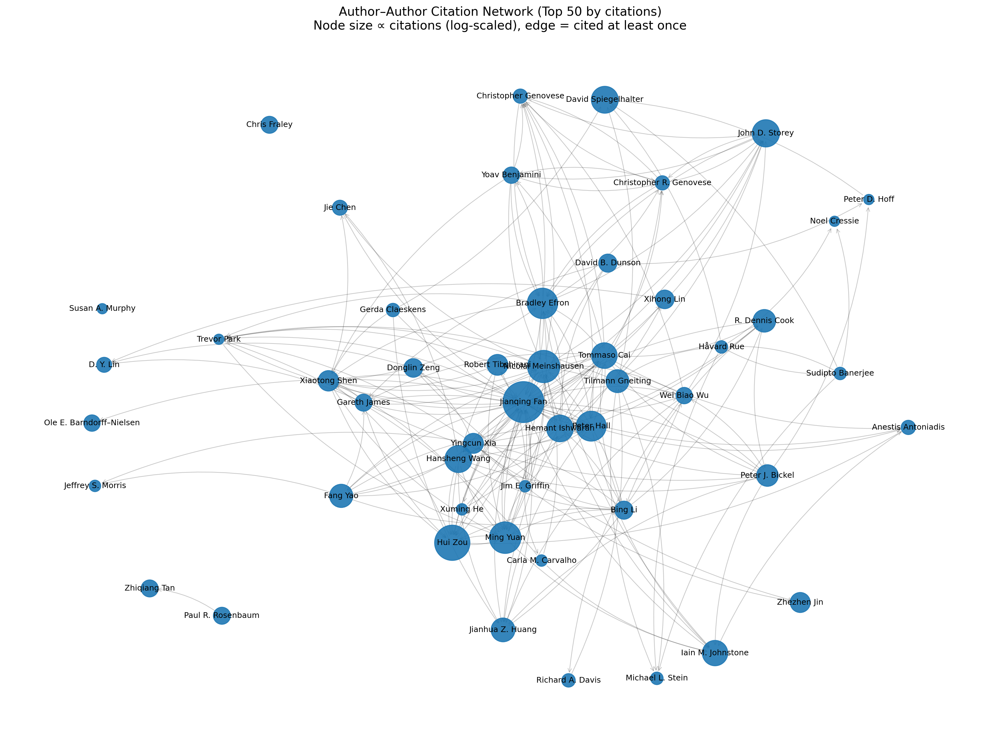

In [81]:
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt

# =========================
# Author–Author Citation Graph (Top 50)
# Node = first_author
# Edge A -> B if ANY paper by A cites ANY paper by B
# Top 50 chosen by citations (author in-degree in full graph)
# Node size = citations (log-scaled, bigger difference)
# Edges drawn faint + curved to avoid covering labels
# =========================

# 0) Clean empty strings
paper_info['first_author'] = paper_info['first_author'].replace('', pd.NA)

# 1) paper_id -> first_author
id_to_author = paper_info.set_index('paper_id')['first_author'].to_dict()

# 2) paper->paper edges -> author->author edges
tmp = paper_citations[['source', 'target']].copy()
tmp['src_author'] = tmp['source'].map(id_to_author)
tmp['tgt_author'] = tmp['target'].map(id_to_author)

aa = tmp.dropna(subset=['src_author', 'tgt_author'])

# optional: remove author-level self-citations
aa = aa[aa['src_author'] != aa['tgt_author']]

# keep one edge as long as cited once
author_edges = aa[['src_author', 'tgt_author']].drop_duplicates()

# 3) build full author graph
G = nx.DiGraph()
G.add_edges_from(author_edges.itertuples(index=False, name=None))

print("=== Author Citation Graph Summary ===")
print(f"Authors (nodes): {G.number_of_nodes():,}")
print(f"Author->Author edges: {G.number_of_edges():,}")

# 4) choose top 50 most-cited authors (highest in-degree in FULL graph)
TOP_N = 50
top_authors = [a for a, _ in sorted(G.in_degree, key=lambda x: x[1], reverse=True)[:TOP_N]]
H = G.subgraph(top_authors).copy()

# 5) node sizes: log-scaled in-degree in FULL graph (bigger differences)
deg_full = dict(G.in_degree(top_authors))
deg_vals = np.array([deg_full[a] for a in H.nodes()], dtype=float)
log_deg = np.log1p(deg_vals)

MIN_SIZE, MAX_SIZE = 140, 2200
if log_deg.max() == log_deg.min():
    node_sizes = np.full_like(log_deg, (MIN_SIZE + MAX_SIZE) / 2)
else:
    node_sizes = (
        MIN_SIZE
        + (log_deg - log_deg.min()) / (log_deg.max() - log_deg.min())
        * (MAX_SIZE - MIN_SIZE)
    )

# 6) plot (less label overlap)
plt.figure(figsize=(16, 12))
pos = nx.spring_layout(H, k=0.9, seed=42)

# edges first: faint + curved
nx.draw_networkx_edges(
    H, pos,
    arrowstyle='->',
    arrowsize=10,
    alpha=0.22,
    width=0.8,
    connectionstyle='arc3,rad=0.15'
)

# nodes
nx.draw_networkx_nodes(
    H, pos,
    node_size=node_sizes,
    node_color='#1f78b4',
    alpha=0.9
)

# labels last
nx.draw_networkx_labels(
    H, pos,
    font_size=9,
    font_color='black'
)

plt.title(
    f"Author–Author Citation Network (Top {TOP_N} by citations)\n"
    "Node size ∝ citations (log-scaled), edge = cited at least once",
    fontsize=14
)

plt.axis('off')
plt.tight_layout()
plt.show()

A.Top-Cited Papers in the Big-4 Network
definition of top cited:在 Big-4 封闭网络内部被引用的次数（in-degree）

/var/folders/d7/dzynmpzs40b_syb9d58xhp680000gn/T/ipykernel_20776/3850875488.py:77: UserWarning: 

The connectionstyle keyword argument is not applicable when drawing edges
with LineCollection.

To make this warning go away, either specify `arrows=True` to
force FancyArrowPatches or use the default values.
Note that using FancyArrowPatches may be slow for large graphs.

  nx.draw_networkx_edges(


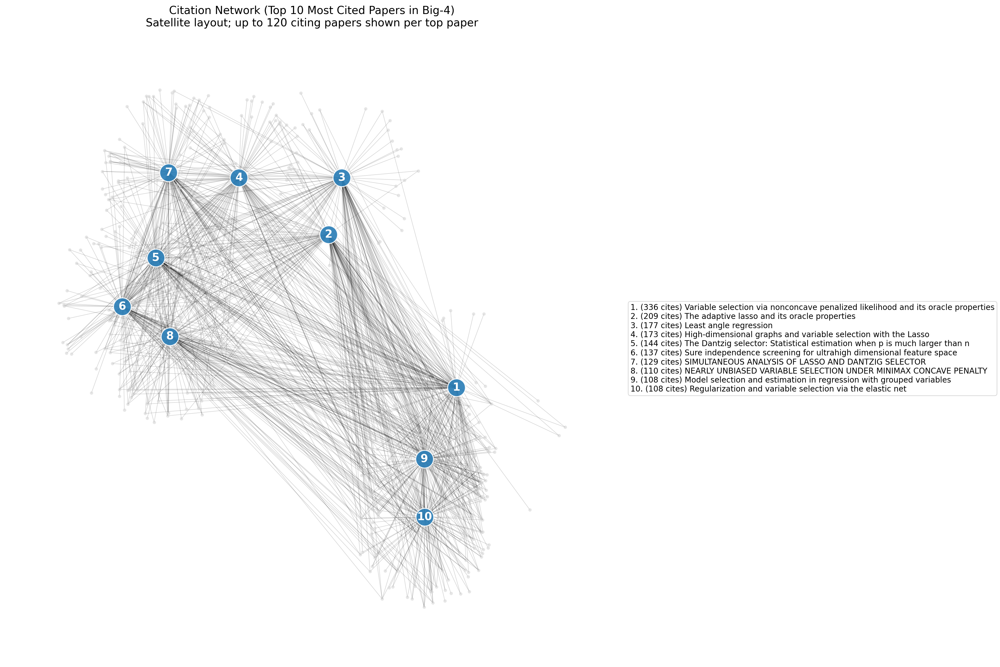

In [93]:
import numpy as np
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt


def plot_top10_citation_network(
    paper_citations: pd.DataFrame,
    paper_info: pd.DataFrame,
    top_n: int = 10,
    max_citers_per_top: int = 120,   # 每个Top论文最多显示多少个引用者（核心参数）
    seed: int = 42,
    figsize=(18, 12),
):
    # -------- 1) Top-N by in-degree --------
    top_cited = paper_citations["target"].value_counts().head(top_n)
    top_ids = top_cited.index.tolist()

    # label: rank + count
    id_to_label = {pid: f"{rank}" for rank, pid in enumerate(top_ids, 1)}  # 图上只放 rank，干净
    legend_lines = []
    for rank, pid in enumerate(top_ids, 1):
        title = paper_info.loc[paper_info["paper_id"] == pid, "title"].values
        t = title[0] if len(title) else f"paper_id={pid}"
        legend_lines.append(f"{rank}. ({top_cited[pid]} cites) {t}")

    # -------- 2) Build a “clean” subgraph: only edges into Top-N --------
    sub = paper_citations[paper_citations["target"].isin(top_ids)].copy()

    # 对每个 top paper：如果引用者太多，只抽样一部分（否则必丑）
    rng = np.random.default_rng(seed)
    keep_rows = []
    for pid in top_ids:
        rows = sub[sub["target"] == pid]
        if len(rows) > max_citers_per_top:
            rows = rows.sample(n=max_citers_per_top, random_state=seed)
        keep_rows.append(rows)
    sub = pd.concat(keep_rows, ignore_index=True)

    # nodes & edges
    citing_nodes = sub["source"].unique().tolist()
    nodes = set(citing_nodes) | set(top_ids)

    G = nx.DiGraph()
    G.add_nodes_from(nodes)
    G.add_edges_from(sub[["source", "target"]].itertuples(index=False, name=None))

    # -------- 3) Deterministic “satellite” layout --------
    # Top nodes on a big circle
    pos = {}
    R = 2.5
    angles = np.linspace(0, 2*np.pi, top_n, endpoint=False)
    for pid, ang in zip(top_ids, angles):
        pos[pid] = (R*np.cos(ang), R*np.sin(ang))

    # Citing nodes: group around their cited top paper
    # (如果一个 citing node 引用多个 top paper，就归到“引用最多的那个”或随机一个)
    target_to_sources = {pid: sub[sub["target"] == pid]["source"].tolist() for pid in top_ids}

    for pid in top_ids:
        srcs = target_to_sources[pid]
        if not srcs:
            continue

        cx, cy = pos[pid]
        r_small = 0.9  # 卫星圈半径
        # 在 pid 周围均匀摆一圈 + 少量抖动
        a = rng.uniform(0, 2*np.pi, size=len(srcs))
        jitter = rng.normal(0, 0.10, size=len(srcs))
        for s, ang, jit in zip(srcs, a, jitter):
            pos[s] = (cx + (r_small + jit)*np.cos(ang), cy + (r_small + jit)*np.sin(ang))

    # -------- 4) Plot --------
    fig, ax = plt.subplots(figsize=figsize)

    # edges: 细 + 浅，不画箭头（箭头会让画面更乱）
    nx.draw_networkx_edges(
        G, pos, ax=ax,
        alpha=0.18, width=0.6,
        arrows=False,
        connectionstyle="arc3,rad=0.08"
    )

    # citing nodes: 小灰点
    regular_nodes = [n for n in G.nodes() if n not in top_ids]
    nx.draw_networkx_nodes(
        G, pos, nodelist=regular_nodes,
        node_size=18, node_color="lightgray", alpha=0.55,
        linewidths=0, ax=ax
    )

    # top nodes: 蓝色大点
    nx.draw_networkx_nodes(
        G, pos, nodelist=top_ids,
        node_size=520, node_color="#2C7FB8", alpha=0.92,
        edgecolors="white", linewidths=1.2, ax=ax
    )

    # labels: 只标 rank（更清爽）
    nx.draw_networkx_labels(
        G, pos, labels=id_to_label,
        font_size=14, font_color="white", font_weight="bold", ax=ax
    )

    ax.set_title(
        f"Citation Network (Top {top_n} Most Cited Papers in Big-4)\n"
        f"Satellite layout; up to {max_citers_per_top} citing papers shown per top paper",
        fontsize=14, pad=12
    )
    ax.axis("off")

    # legend：右侧文本框（不挤压画布）
    legend_str = "\n".join(legend_lines)
    ax.text(
        1.02, 0.5, legend_str, transform=ax.transAxes,
        fontsize=10, va="center", ha="left",
        bbox=dict(boxstyle="round", facecolor="white", alpha=0.9, edgecolor="0.85")
    )

    plt.tight_layout()
    plt.show()

    return G


# --- run ---
_ = plot_top10_citation_network(
    paper_citations=paper_citations,
    paper_info=paper_info,
    top_n=10,
    max_citers_per_top=120,  # 你可以试 60/100/200，看哪个最好看
    seed=42
)

B.Authority Identification in the Citation Network

Original edges: 23737
Edges within Big 4: 23709
Graph constructed with 5737 nodes and 23709 edges.

🏆 Top 10 Authorities (The 'Must-Read' List - High Impact Research):
                                                                           title publisher   year  authority_score
Variable selection via nonconcave penalized likelihood and its oracle properties      JASA 2001.0         0.055689
                                    The adaptive lasso and its oracle properties      JASA 2006.0         0.039297
                                                          Least angle regression    Annals    NaN         0.026680
       The Dantzig selector: Statistical estimation when p is much larger than n    Annals    NaN         0.024354
                   High-dimensional graphs and variable selection with the Lasso    Annals 2006.0         0.023842
             Sure independence screening for ultrahigh dimensional feature space    JRSS-B 2008.0         0.023039
                NEARLY UNBI

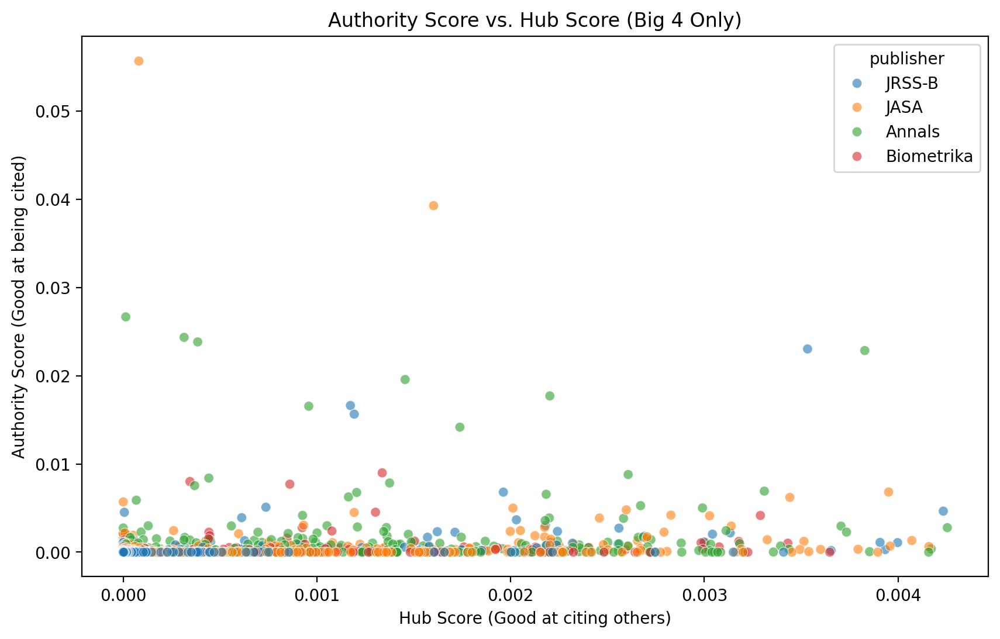


=== Comparison: HITS Authority vs. Raw Citation Counts ===
Top 10 Overlap: 9/10 papers match.
Top 50 Overlap: 28/50 papers match.

Insight: The 'Must-Read' list (HITS) is NOT identical to the 'Most Cited' list.
HITS identifies papers that are cited by *other important papers*, not just popular ones.

💎 Hidden Gems (High Authority but not in Top 10 Raw Citations):
                                                              title  authority_score
One-step sparse estimates in nonconcave penalized likelihood models         0.017717


In [95]:
# 5.1 HITS Algorithm Implementation
# Calculate Hubs and Authorities scores to identify "Must-Read" papers

# 1. Construct the graph using ONLY Big 4 papers (Cleaned Data)
# Filter edges where both source and target are in our cleaned paper_info
valid_ids = set(paper_info['paper_id'])
cleaned_citations = paper_citations[
    paper_citations['source'].isin(valid_ids) & 
    paper_citations['target'].isin(valid_ids)
]

print(f"Original edges: {len(paper_citations)}")
print(f"Edges within Big 4: {len(cleaned_citations)}")

G_full = nx.from_pandas_edgelist(
    cleaned_citations, 
    source='source', 
    target='target', 
    create_using=nx.DiGraph()
)

print(f"Graph constructed with {G_full.number_of_nodes()} nodes and {G_full.number_of_edges()} edges.")

# 2. Run HITS Algorithm
try:
    # max_iter=1000 to ensure convergence
    hubs, authorities = nx.hits(G_full, max_iter=1000, normalized=True)
    
    # 3. Process Results
    # Convert to DataFrame
    auth_df = pd.DataFrame(list(authorities.items()), columns=['paper_id', 'authority_score'])
    hub_df = pd.DataFrame(list(hubs.items()), columns=['paper_id', 'hub_score'])
    
    # Merge with paper info to get titles and journals
    # Check if 'year' exists (it might be created in a later cell)
    cols_to_use = ['paper_id', 'title', 'publisher']
    if 'year' in paper_info.columns:
        cols_to_use.append('year')

    auth_df = auth_df.merge(paper_info[cols_to_use], on='paper_id', how='left')
    hub_df = hub_df.merge(paper_info[cols_to_use], on='paper_id', how='left')
    
    # Sort by score
    top_authorities = auth_df.sort_values('authority_score', ascending=False).head(10)
    top_hubs = hub_df.sort_values('hub_score', ascending=False).head(10)
    
    # 4. Display "Must-Read List" (Top Authorities)
    print("\n🏆 Top 10 Authorities (The 'Must-Read' List - High Impact Research):")
    # Format for display
    display_cols_auth = ['title', 'publisher', 'authority_score']
    if 'year' in auth_df.columns:
        display_cols_auth.insert(2, 'year')
    print(top_authorities[display_cols_auth].to_string(index=False))
    
    # 5. Display "Top Reviewers/Connectors" (Top Hubs)
    print("\n🔗 Top 10 Hubs (The 'Best Connectors' - Reviews/Broad Citations):")
    display_cols_hub = ['title', 'publisher', 'hub_score']
    if 'year' in hub_df.columns:
        display_cols_hub.insert(2, 'year')
    print(top_hubs[display_cols_hub].to_string(index=False))
    
    # 6. Visualization: Authority vs Hub Score
    # Are authorities also hubs? (Usually no)
    merged_scores = auth_df.merge(hub_df[['paper_id', 'hub_score']], on='paper_id')
    
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x='hub_score', y='authority_score', data=merged_scores, alpha=0.6, hue='publisher')
    plt.title('Authority Score vs. Hub Score (Big 4 Only)')
    plt.xlabel('Hub Score (Good at citing others)')
    plt.ylabel('Authority Score (Good at being cited)')
    plt.show()

    # ==========================================
    # 7. Comparison: Authority vs. Most Cited
    # ==========================================
    print("\n=== Comparison: HITS Authority vs. Raw Citation Counts ===")
    
    # Get Top 10 and Top 50 Most Cited (using cleaned citations)
    citation_counts_check = cleaned_citations['target'].value_counts().reset_index()
    citation_counts_check.columns = ['paper_id', 'citations']
    
    top_10_cited_ids = set(citation_counts_check.head(10)['paper_id'])
    top_50_cited_ids = set(citation_counts_check.head(50)['paper_id'])
    
    top_10_auth_ids = set(auth_df.sort_values('authority_score', ascending=False).head(10)['paper_id'])
    top_50_auth_ids = set(auth_df.sort_values('authority_score', ascending=False).head(50)['paper_id'])
    
    # Calculate Overlap
    overlap_10 = top_10_cited_ids.intersection(top_10_auth_ids)
    overlap_50 = top_50_cited_ids.intersection(top_50_auth_ids)
    
    print(f"Top 10 Overlap: {len(overlap_10)}/10 papers match.")
    print(f"Top 50 Overlap: {len(overlap_50)}/50 papers match.")
    
    if len(overlap_10) < 10:
        print("\nInsight: The 'Must-Read' list (HITS) is NOT identical to the 'Most Cited' list.")
        print("HITS identifies papers that are cited by *other important papers*, not just popular ones.")
        
        # Show papers that are in Top 10 Authority but NOT in Top 10 Cited (Hidden Gems)
        hidden_gems_ids = top_10_auth_ids - top_10_cited_ids
        if hidden_gems_ids:
            print("\n💎 Hidden Gems (High Authority but not in Top 10 Raw Citations):")
            hidden_gems = auth_df[auth_df['paper_id'].isin(hidden_gems_ids)]
            print(hidden_gems[['title', 'authority_score']].to_string(index=False))

except nx.PowerIterationFailedConvergence:
    print("HITS algorithm failed to converge. The graph might be too sparse or disconnected.")
except Exception as e:
    print(f"An error occurred: {e}")
    import traceback
    traceback.print_exc()

C.Journal-Level Citation Structure


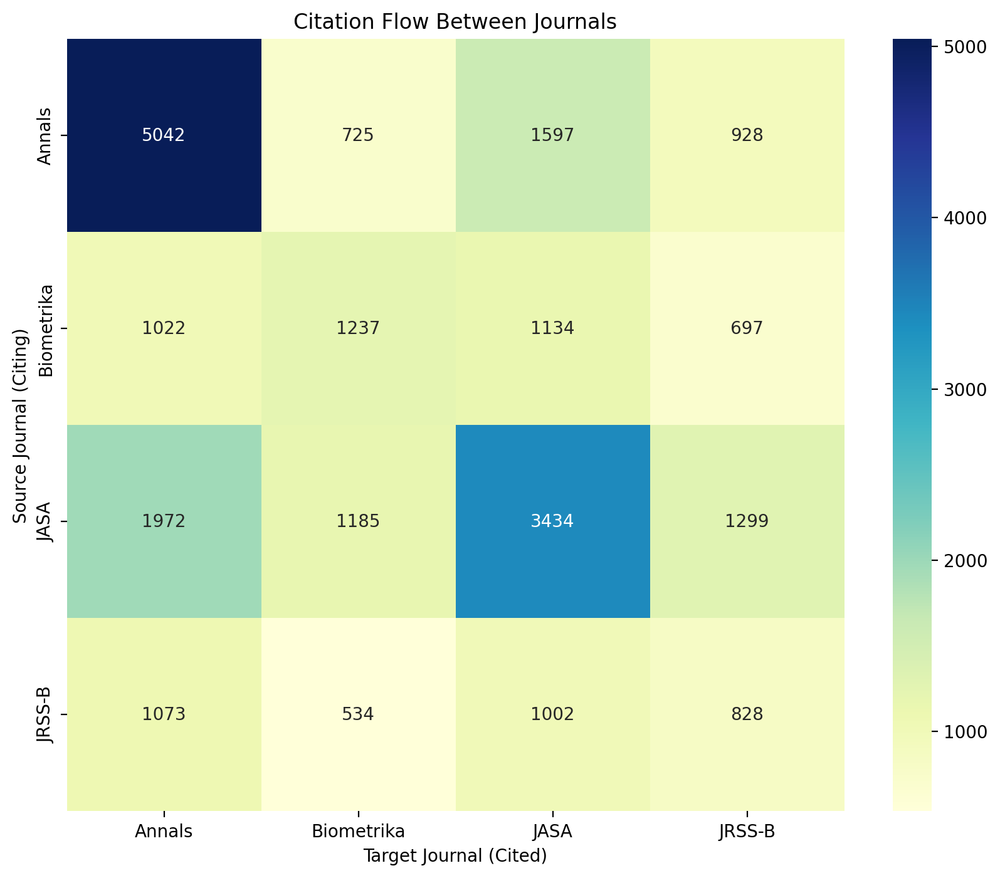

In [97]:
# 4. Journal Citation Heatmap
# Analyze how journals cite each other
# Merge source journal
merged_citations = paper_citations.merge(paper_info[['paper_id', 'publisher']], left_on='source', right_on='paper_id', how='left')
merged_citations.rename(columns={'publisher': 'source_journal'}, inplace=True)

# Merge target journal
merged_citations = merged_citations.merge(paper_info[['paper_id', 'publisher']], left_on='target', right_on='paper_id', how='left')
merged_citations.rename(columns={'publisher': 'target_journal'}, inplace=True)

# Create pivot table
heatmap_data = pd.crosstab(merged_citations['source_journal'], merged_citations['target_journal'])

plt.figure(figsize=(10, 8))
sns.heatmap(heatmap_data, annot=True, fmt='d', cmap='YlGnBu')
plt.title('Citation Flow Between Journals')
plt.ylabel('Source Journal (Citing)')
plt.xlabel('Target Journal (Cited)')
plt.show()

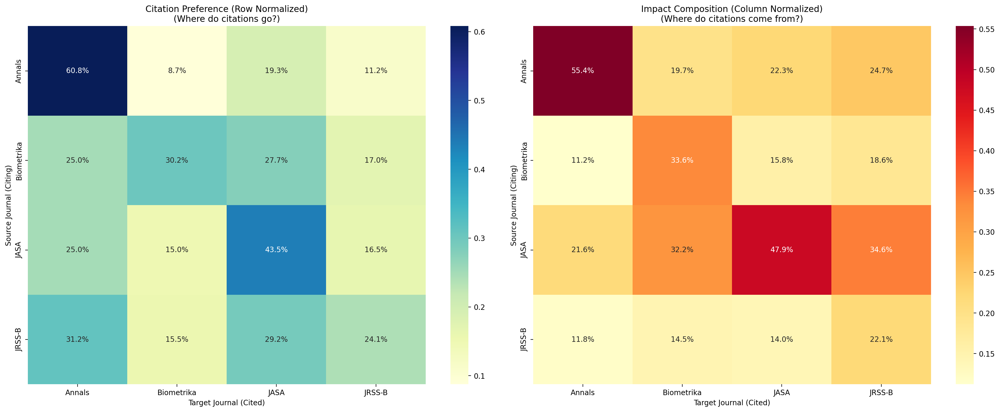

In [98]:
# 4.1 Normalized Heatmaps (Size Bias Correction)
# To address the "Size Bias" (some journals publish more papers), we normalize the citation counts.

fig, axes = plt.subplots(1, 2, figsize=(20, 8))

# 1. Row Normalization: Citation Preference (Outflow)
# "When a journal cites, who do they cite?"
# Divide each row by the row sum
heatmap_row_norm = heatmap_data.div(heatmap_data.sum(axis=1), axis=0)

sns.heatmap(heatmap_row_norm, annot=True, fmt='.1%', cmap='YlGnBu', ax=axes[0])
axes[0].set_title('Citation Preference (Row Normalized)\n(Where do citations go?)')
axes[0].set_ylabel('Source Journal (Citing)')
axes[0].set_xlabel('Target Journal (Cited)')

# 2. Column Normalization: Impact Composition (Inflow)
# "When a journal is cited, who is citing them?"
# Divide each column by the column sum
heatmap_col_norm = heatmap_data.div(heatmap_data.sum(axis=0), axis=1)

sns.heatmap(heatmap_col_norm, annot=True, fmt='.1%', cmap='YlOrRd', ax=axes[1])
axes[1].set_title('Impact Composition (Column Normalized)\n(Where do citations come from?)')
axes[1].set_ylabel('Source Journal (Citing)')
axes[1].set_xlabel('Target Journal (Cited)')

plt.tight_layout()
plt.show()


D.Statistical Significance of Citation Preferences

=== Chi-square Test Results ===
Chi-square Statistic: 3575.79
P-value: 0.0000e+00
Degrees of Freedom: 9

Conclusion: Reject Null Hypothesis (p < 0.05).
The citation behavior is NOT random. There are statistically significant preferences between journals.


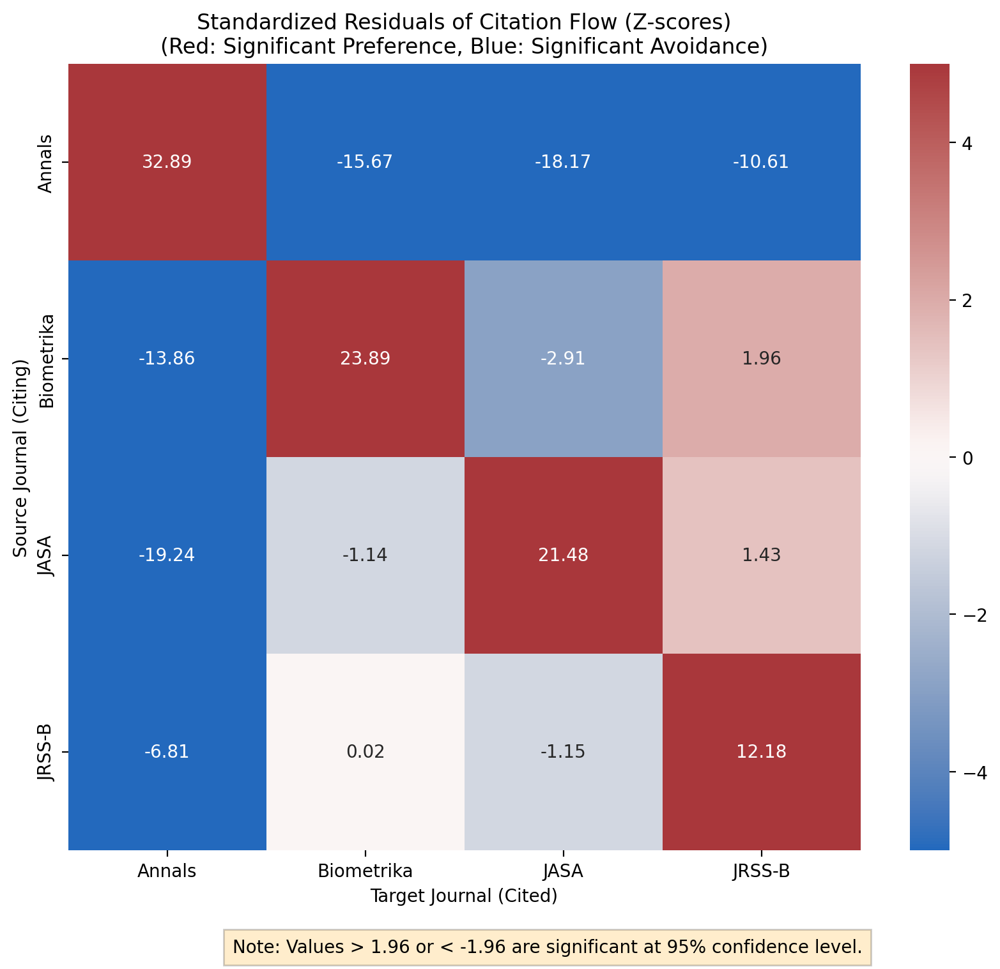

In [99]:
# 4.2 Statistical Significance Test (Chi-square & Residuals)
from scipy.stats import chi2_contingency

# 1. Perform Chi-square test of independence
# H0: The source and target journals are independent (no specific preference)
chi2, p, dof, expected = chi2_contingency(heatmap_data)

print("=== Chi-square Test Results ===")
print(f"Chi-square Statistic: {chi2:.2f}")
print(f"P-value: {p:.4e}")
print(f"Degrees of Freedom: {dof}")

if p < 0.05:
    print("\nConclusion: Reject Null Hypothesis (p < 0.05).")
    print("The citation behavior is NOT random. There are statistically significant preferences between journals.")
else:
    print("\nConclusion: Accept Null Hypothesis.")
    print("No significant preferences found.")

# 2. Calculate Standardized Residuals (Z-scores)
# Formula: (Observed - Expected) / sqrt(Expected)
# This tells us WHICH specific cells are contributing to the non-randomness
observed = heatmap_data.values
residuals = (observed - expected) / np.sqrt(expected)

# Convert to DataFrame for plotting
residuals_df = pd.DataFrame(residuals, index=heatmap_data.index, columns=heatmap_data.columns)

# 3. Visualize Residuals
plt.figure(figsize=(10, 8))
# Use a diverging colormap (Red = More than expected, Blue = Less than expected)
# Center at 0. Range +/- 3 covers most significant values (Z > 1.96 is significant at 95% confidence)
sns.heatmap(residuals_df, annot=True, fmt='.2f', cmap='vlag', center=0, vmin=-5, vmax=5)

plt.title('Standardized Residuals of Citation Flow (Z-scores)\n(Red: Significant Preference, Blue: Significant Avoidance)')
plt.ylabel('Source Journal (Citing)')
plt.xlabel('Target Journal (Cited)')

# Add a note about significance threshold
plt.figtext(0.5, 0.01, "Note: Values > 1.96 or < -1.96 are significant at 95% confidence level.", ha="center", fontsize=10, bbox={"facecolor":"orange", "alpha":0.2, "pad":5})

plt.show()

In [100]:
# 6.1 Link Prediction using Node2Vec

import warnings
warnings.filterwarnings('ignore') # Suppress warnings for cleaner output

try:
    from node2vec import Node2Vec
    from gensim.models import Word2Vec
    import gensim
    
    print(f"Gensim version: {gensim.__version__}")
    print("Training Node2Vec model... (This may take a while)")
    
    # 1. Initialize Node2Vec (Generates Random Walks)
    # dimensions: vector size (64 is a good balance for this graph size)
    # walk_length: length of random walk
    # num_walks: number of walks per node
    # workers: parallel threads (set to 1 for stability in some envs)
    # Note: We don't use node2vec.fit() to avoid gensim version compatibility issues
    node2vec_obj = Node2Vec(G_full, dimensions=64, walk_length=10, num_walks=10, workers=1, quiet=True)
    
    # 2. Train Word2Vec Model manually
    # Ensure walks are list of strings
    walks = [[str(node) for node in walk] for walk in node2vec_obj.walks]
    
    # Handle gensim 4.0.0+ API change (size -> vector_size)
    if gensim.__version__ >= '4.0.0':
        model = Word2Vec(sentences=walks, vector_size=64, window=10, min_count=1, workers=1, sg=1)
    else:
        model = Word2Vec(sentences=walks, size=64, window=10, min_count=1, workers=1, sg=1)
        
    print("Model training complete.")
    
    # 3. Define Recommendation Function
    def recommend_citations(paper_id, top_k=5):
        str_id = str(paper_id)
        # Check if node exists in the model
        if str_id not in model.wv:
            return None
            
        # Get most similar nodes (returns list of (id, score))
        # We ask for more than top_k because we need to filter existing edges
        potential_links = model.wv.most_similar(str_id, topn=top_k*20)
        
        # Get existing citations to filter them out
        # G_full is the graph we used
        if paper_id in G_full:
            existing_citations = set(G_full.successors(paper_id))
        else:
            existing_citations = set()
        
        recommendations = []
        for neighbor_id_str, score in potential_links:
            try:
                neighbor_id = int(neighbor_id_str)
            except ValueError:
                continue # Skip if not integer id
                
            # Filter: Not self, and not already cited
            if neighbor_id not in existing_citations and neighbor_id != paper_id:
                recommendations.append({'paper_id': neighbor_id, 'similarity': score})
                if len(recommendations) >= top_k:
                    break
        
        if not recommendations:
            return pd.DataFrame()
            
        rec_df = pd.DataFrame(recommendations)
        # Merge with metadata for readability
        cols_to_use = ['paper_id', 'title', 'publisher']
        if 'year' in paper_info.columns:
            cols_to_use.append('year')
            
        rec_df = rec_df.merge(paper_info[cols_to_use], on='paper_id', how='left')
        return rec_df

    # 4. Demo: Recommend for a Top Authority Paper
    # Let's pick the top 1 authority from previous step
    if 'top_authorities' in locals() and not top_authorities.empty:
        target_paper = top_authorities.iloc[0]
        pid = target_paper['paper_id']
        title = target_paper['title']
        
        print(f"\n📚 Generating Recommendations for: [{pid}] {title[:50]}...")
        recs = recommend_citations(pid, top_k=5)
        
        if recs is not None and not recs.empty:
            print("\n💡 Recommended Citations (Potential Missing Links):")
            display_cols = ['similarity', 'title', 'publisher']
            if 'year' in recs.columns:
                display_cols.append('year')
            print(recs[display_cols].to_string(index=False))
        else:
            print("No recommendations found.")
            
except ImportError:
    print("Error: 'node2vec' library not found.")
    print("Please run: !pip install node2vec")
    print("Or use the terminal to install it.")
except Exception as e:
    print(f"An error occurred: {e}")
    import traceback
    traceback.print_exc()

Error: 'node2vec' library not found.
Please run: !pip install node2vec
Or use the terminal to install it.
